# Installing Dependencies

In [1]:
!pip install torchmetrics mlflow optuna pyngrok --upgrade nltk

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 960.9/960.9 kB 23.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.2/28.2 MB 64.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.1/6.1 MB 95.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 59.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.9/114.9 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 681.0/681.0 kB 34.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.2/95.2 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.4/203.4 kB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 3.9 MB/s eta 0:00:00
  Attempting uninstall: nltk
    Found existing installation: nltk 3.2.4
    Uninstalling nltk-3.2.4:
      Successfully uninstalled

# Importing Libraries

In [2]:
# For loading the data
import os
from google.colab import userdata
from zipfile import ZipFile

# For getting data in the right format
import pandas as pd
import numpy as np
import kagglehub
pd.set_option('display.max_colwidth', None)

# For finding vocabulary of textual data
import spacy
from collections import Counter

# For viewing and preprocessing images
from PIL import Image

# For Dataset and Data Loading
import torch
from torch.utils.data import DataLoader, Dataset, Subset
from torchvision import transforms
from torch.nn.utils.rnn import pad_sequence
import random
import torchvision
from torch.autograd import Variable

# For train test split of data
import shutil
from sklearn.model_selection import train_test_split

# For plotting images
import matplotlib.pyplot as plt

# For model architecture
import torch.nn as nn
import torchvision.models as models
import torch.optim as optim

# For training loop
from tqdm import tqdm
from torchmetrics.text import BLEUScore, ROUGEScore

# For hyperparameter tuning and experiment tracking
import optuna
import mlflow.pytorch
from pyngrok import ngrok

# For Learning rate scheduling
import torch.optim.lr_scheduler as lr_scheduler

# For dumping features
import pickle as pkl

# For transformer decoder
import math
import random

# CNN + Transformer Decoder

## Data Preprocessing

In [3]:
Base_path = '/kaggle/input/flickr8k'
df = pd.read_csv(Base_path + ('').join('/captions.txt'))
df

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playhouse .
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a wooden cabin .
...,...,...
40450,997722733_0cb5439472.jpg,A man in a pink shirt climbs a rock face
40451,997722733_0cb5439472.jpg,A man is rock climbing high in the air .
40452,997722733_0cb5439472.jpg,A person in a red shirt climbing up a rock face covered in assist handles .
40453,997722733_0cb5439472.jpg,A rock climber in a red shirt .


In [4]:
def remove_single_char_word(word_list):
    lst = []
    for word in word_list:
        if len(word)>1:
          lst.append(word)

    return lst

In [5]:
def captions_preprocessing(data):
  """
    Preprocesses the image captions - like keeping only alphabets, converting all words to lowercase and adding
    <SOS>, <EOS>, <PAD> tokens to each.
    Args: pandas DataFrame

    Returns: pandas DataFrame
    """

  df['cleaned_caption'] = df['caption'].apply(lambda caption: ['<SOS>'] +
   [word.lower() if word.isalpha() else '' for word in caption.split(" ")] + ['<EOS>'])
  df['seq_len'] = df['cleaned_caption'].apply(lambda x: len(x))
  df['cleaned_caption']  = df['cleaned_caption'].apply(lambda x : remove_single_char_word(x))
  max_seq_len = df['seq_len'].max()
  print("Length of longest caption after preprocessing", max_seq_len)
  df.drop(["seq_len"], axis=1, inplace=True)
  df['cleaned_caption'] = df['cleaned_caption'].apply(lambda x: x + ['<PAD>']*(max_seq_len-len(x)))

  return df, max_seq_len

In [6]:
df, max_seq_len = captions_preprocessing(df)
print('Longest caption is of length: ',max_seq_len)
df.sample(10)

Length of longest caption after preprocessing 40
Longest caption is of length:  40


,image,caption,cleaned_caption
32342,3600909823_ce72c26e66.jpg,A skateboarder does a trick on the coping of a bowl .,"[<SOS>, skateboarder, does, trick, on, the, coping, of, bowl, <EOS>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>]"
27479,3413669228_ec64efeb34.jpg,The girl takes a break from rollerblading .,"[<SOS>, the, girl, takes, break, from, rollerblading, <EOS>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>]"
21,1007129816_e794419615.jpg,A man wears an orange hat and glasses .,"[<SOS>, man, wears, an, orange, hat, and, glasses, <EOS>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>]"
13088,2676648667_cb055b4fc6.jpg,This woman is sitting in a lawnchair on the sand .,"[<SOS>, this, woman, is, sitting, in, lawnchair, on, the, sand, <EOS>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>]"
6572,2248487956_2603f55ab9.jpg,A woman scratching her face .,"[<SOS>, woman, scratching, her, face, <EOS>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>]"
24730,3295671644_0e10891b6d.jpg,A black and white dog looking at the camera .,"[<SOS>, black, and, white, dog, looking, at, the, camera, <EOS>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>]"
38239,530950375_eea665583f.jpg,Man in punkish outfit rides unusual bike on city sidewalk .,"[<SOS>, man, in, punkish, outfit, rides, unusual, bike, on, city, sidewalk, <EOS>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>]"
5407,2140305708_591d10b54d.jpg,A girl in a blue two piece bathing suit at the beach .,"[<SOS>, girl, in, blue, two, piece, bathing, suit, at, the, beach, <EOS>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>]"
12646,2647049174_0fb47cee2e.jpg,A little boy who is playing outdoors is tasting dirt .,"[<SOS>, little, boy, who, is, playing, outdoors, is, tasting, dirt, <EOS>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>]"
35676,393284934_d38e1cd6fe.jpg,A dog that is wearing a red cap is standing by a guitar with its mouth wide open .,"[<SOS>, dog, that, is, wearing, red, cap, is, standing, by, guitar, with, its, mouth, wide, open, <EOS>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>]"


In [7]:
def getVocabAndTokenMappings(df):
  """
  Creates the Vocabulary from Captions. Also implements stoi() and itos()

  Args: pandas DataFrame

  Returns:
    word_dict: Dictionary
    int_to_str: Dictionary
    str_to_int: Dictionary

  """
  word_list = df['cleaned_caption'].apply(lambda caption: " ".join(caption)).str.cat(sep= ' ').split(' ')
  word_dict = Counter(word_list)
  word_dict = sorted(word_dict, key=word_dict.get, reverse=True)
  print("No. of Unique words in our Caption Vocabulary: ",len(word_dict))
  print("Top 5 most frequent words :",word_dict[:5])

  int_to_str = {index: word for index, word in enumerate(word_dict)}
  str_to_int = {word: index for index, word in enumerate(word_dict)}

  return word_dict, int_to_str, str_to_int

In [8]:
word_dict, int_to_str, str_to_int = getVocabAndTokenMappings(df)

No. of Unique words in our Caption Vocabulary:  8360
Top 5 most frequent words : ['<PAD>', '<SOS>', '<EOS>', 'in', 'the']


In [9]:
word_dict

['<PAD>',
 '<SOS>',
 '<EOS>',
 'in',
 'the',
 'on',
 'is',
 'and',
 'dog',
 'with',
 'man',
 'of',
 'two',
 'white',
 'black',
 'boy',
 'are',
 'woman',
 'girl',
 'to',
 'wearing',
 'at',
 'people',
 'water',
 'red',
 'young',
 'brown',
 'an',
 'his',
 'blue',
 'dogs',
 'running',
 'through',
 'playing',
 'while',
 'down',
 'shirt',
 'standing',
 'ball',
 'little',
 'grass',
 'child',
 'person',
 'snow',
 'jumping',
 'over',
 'front',
 'three',
 'sitting',
 'holding',
 'field',
 'small',
 'up',
 'by',
 'large',
 'green',
 'group',
 'one',
 'yellow',
 'her',
 'walking',
 'children',
 'men',
 'into',
 'air',
 'beach',
 'near',
 'mouth',
 'jumps',
 'another',
 'for',
 'street',
 'runs',
 'its',
 'from',
 'riding',
 'stands',
 'as',
 'bike',
 'girls',
 'outside',
 'other',
 'out',
 'rock',
 'next',
 'play',
 'off',
 'looking',
 'orange',
 'pink',
 'player',
 'their',
 'camera',
 'pool',
 'hat',
 'jacket',
 'boys',
 'women',
 'around',
 'behind',
 'some',
 'background',
 'dirt',
 'toy',
 's

In [10]:
str_to_int, int_to_str

({'<PAD>': 0,
  '<SOS>': 1,
  '<EOS>': 2,
  'in': 3,
  'the': 4,
  'on': 5,
  'is': 6,
  'and': 7,
  'dog': 8,
  'with': 9,
  'man': 10,
  'of': 11,
  'two': 12,
  'white': 13,
  'black': 14,
  'boy': 15,
  'are': 16,
  'woman': 17,
  'girl': 18,
  'to': 19,
  'wearing': 20,
  'at': 21,
  'people': 22,
  'water': 23,
  'red': 24,
  'young': 25,
  'brown': 26,
  'an': 27,
  'his': 28,
  'blue': 29,
  'dogs': 30,
  'running': 31,
  'through': 32,
  'playing': 33,
  'while': 34,
  'down': 35,
  'shirt': 36,
  'standing': 37,
  'ball': 38,
  'little': 39,
  'grass': 40,
  'child': 41,
  'person': 42,
  'snow': 43,
  'jumping': 44,
  'over': 45,
  'front': 46,
  'three': 47,
  'sitting': 48,
  'holding': 49,
  'field': 50,
  'small': 51,
  'up': 52,
  'by': 53,
  'large': 54,
  'green': 55,
  'group': 56,
  'one': 57,
  'yellow': 58,
  'her': 59,
  'walking': 60,
  'children': 61,
  'men': 62,
  'into': 63,
  'air': 64,
  'beach': 65,
  'near': 66,
  'mouth': 67,
  'jumps': 68,
  'another':

In [11]:
df['text_seq']  = df['cleaned_caption'].apply(lambda caption : [str_to_int[word] for word in caption] )
df

,image,caption,cleaned_caption,text_seq
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .,"[<SOS>, child, in, pink, dress, is, climbing, up, set, of, stairs, in, an, entry, way, <EOS>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>]","[1, 41, 3, 89, 168, 6, 118, 52, 392, 11, 389, 3, 27, 5075, 690, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .,"[<SOS>, girl, going, into, wooden, building, <EOS>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>]","[1, 18, 311, 63, 192, 116, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .,"[<SOS>, little, girl, climbing, into, wooden, playhouse, <EOS>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>]","[1, 39, 18, 118, 63, 192, 2402, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playhouse .,"[<SOS>, little, girl, climbing, the, stairs, to, her, playhouse, <EOS>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>]","[1, 39, 18, 118, 4, 389, 19, 59, 2402, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a wooden cabin .,"[<SOS>, little, girl, in, pink, dress, going, into, wooden, cabin, <EOS>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>]","[1, 39, 18, 3, 89, 168, 311, 63, 192, 2949, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
...,...,...,...,...
40450,997722733_0cb5439472.jpg,A man in a pink shirt climbs a rock face,"[<SOS>, man, in, pink, shirt, climbs, rock, face, <EOS>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>]","[1, 10, 3, 89, 36, 250, 83, 122, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
40451,997722733_0cb5439472.jpg,A man is rock climbing high in the air .,"[<SOS>, man, is, rock, climbing, high, in, the, air, <EOS>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>]","[1, 10, 6, 83, 118, 194, 3, 4, 64, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
40452,997722733_0cb5439472.jpg,A person in a red shirt climbing up a rock face covered in assist handles .,"[<SOS>, person, in, red, shirt, climbing, up, rock, face, covered, in, assist, handles, <EOS>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>, <PAD>]","[1, 42, 3, 24, 36, 118, 52, 83, 122, 184, 3, 3528, 1716, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

## Train and Validation Split

In [12]:
df = df.sort_values(by='image')
train = df.iloc[:int(0.9*len(df))]
valid = df.iloc[int(0.9*len(df)):]
len(train), len(valid)

(36409, 4046)

In [13]:
print(f"Total training images: {len(train)} | Total unique training images: {train['image'].nunique()}")
print(f"Total validation images: {len(valid)} | Total unique validation images: {valid['image'].nunique()}")

Total training images: 36409 | Total unique training images: 7282
Total validation images: 4046 | Total unique validation images: 810


In [14]:
class extractImageFeaturesResnetDataset():
  def __init__(self, data):
    super(extractImageFeaturesResnetDataset, self).__init__()
    self.data = data
    self.trans = transforms.Resize([224, 224])
    self.normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                  std=[0.229, 0.224, 0.225])
    self.to_tensor = transforms.ToTensor()
    self.base_path = '/kaggle/input/flickr8k'

  def __len__(self):
    return len(self.data)

  def __getitem__(self, idx):
    image_name = self.data.iloc[idx]['image']
    img_loc = self.base_path + '/Images/' + str(image_name)
    img = Image.open(img_loc)
    transformed_image = self.normalize(self.to_tensor(self.trans(img)))

    return image_name, transformed_image

  def show_image(self, idx):
      image_name = self.data.iloc[idx]['image']
      img_loc = self.base_path + '/Images/' + str(image_name)
      img = Image.open(img_loc)
      inp = np.array(img)
      plt.imshow(inp)
      captions = self.data.loc[self.data['image'] == image_name, 'caption'].values
      plt.title("\n".join(captions), fontsize=10)

In [15]:
temp = extractImageFeaturesResnetDataset(df)
temp[2]

('1000268201_693b08cb0e.jpg',
 tensor([[[-0.7137, -0.2171, -0.1314,  ..., -2.0494, -2.0152, -2.0152],
          [-0.7650, -0.1828, -0.0801,  ..., -1.9809, -1.9980, -1.9124],
          [-0.7993, -0.1143, -0.0458,  ..., -1.9809, -1.9980, -1.9467],
          ...,
          [ 1.0673,  0.4508,  0.8104,  ...,  1.5125,  0.7077,  0.7077],
          [ 0.8961,  0.9132,  1.6495,  ...,  1.4783,  0.7591,  0.7591],
          [ 1.4269,  1.4612,  1.0844,  ...,  1.3927,  0.7419,  0.7762]],
 
         [[-0.5126,  0.2052,  0.3102,  ..., -1.9832, -1.9307, -1.8957],
          [-0.5651,  0.2227,  0.3803,  ..., -1.8782, -1.8606, -1.6681],
          [-0.6527,  0.2752,  0.4328,  ..., -1.8782, -1.8081, -1.6506],
          ...,
          [-0.1450, -0.6352,  0.1001,  ...,  1.8333,  1.2031,  1.1856],
          [-0.3550,  0.2227,  0.9230,  ...,  1.7808,  1.1856,  1.1856],
          [ 0.1702,  0.5553,  0.1001,  ...,  1.7108,  1.1856,  1.1856]],
 
         [[-0.1138,  0.3742,  0.4091,  ..., -1.7522, -1.7347, -1.7173]

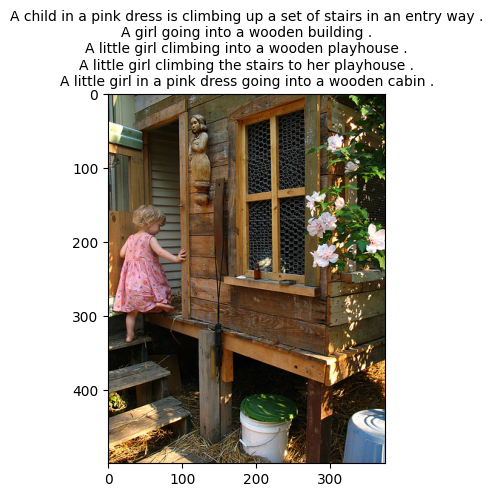

In [16]:
temp.show_image(2)

In [17]:
unq_train_imgs = train[['image']].drop_duplicates()
unq_valid_imgs = valid[['image']].drop_duplicates()
len(unq_train_imgs), len(unq_valid_imgs)

(7282, 810)

In [18]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

train_imageDataset_Resnet = extractImageFeaturesResnetDataset(unq_train_imgs)
train_imageDataLoader_Resnet = DataLoader(train_imageDataset_Resnet, batch_size=1, shuffle=False)

valid_imageDataset_Resnet = extractImageFeaturesResnetDataset(unq_valid_imgs)
valid_imageDataLoader_Resnet = DataLoader(valid_imageDataset_Resnet, batch_size=1, shuffle=False)

cuda


In [19]:
train_imageDataLoader_Resnet, valid_imageDataLoader_Resnet

(<torch.utils.data.dataloader.DataLoader at 0x7da58d286590>,
 <torch.utils.data.dataloader.DataLoader at 0x7da58d287190>)

## Encoder Feature Extraction

In [20]:
resnet50 = models.resnet50(pretrained=True).to(device)
resnet50.eval()
list(resnet50._modules)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 195MB/s]


['conv1',
 'bn1',
 'relu',
 'maxpool',
 'layer1',
 'layer2',
 'layer3',
 'layer4',
 'avgpool',
 'fc']

In [21]:
resnet50_feature_extractor = nn.Sequential(*list(resnet50.children())[:-2]).to(device)
resnet50_feature_extractor

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)


In [22]:
resNet50Layer4 = resnet50._modules.get('layer4').to(device)
resNet50Layer4

Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): 

In [23]:
# resnet18 = torchvision.models.resnet18(pretrained=True).to(device)
# resnet18.eval()
# list(resnet18._modules)
# resNet18Layer4 = resnet18._modules.get('layer4').to(device)
resNet50Layer4 = resnet50._modules.get('layer4').to(device)


def get_vector(t_img):

    t_img = Variable(t_img)
    # my_embedding = torch.zeros(1, 512, 7, 7)
    my_embedding = torch.zeros(1, 2048, 7, 7)
    def copy_data(m, i, o):
        my_embedding.copy_(o.data)

    # h = resNet18Layer4.register_forward_hook(copy_data)
    h = resNet50Layer4.register_forward_hook(copy_data)
    # resnet18(t_img)
    resnet50(t_img)

    h.remove()
    return my_embedding

In [24]:
extract_imgFeatures_resnet_train = {}
for image_name, img in tqdm(train_imageDataLoader_Resnet):
  img = img.to(device)
  embeddings = get_vector(img)

  extract_imgFeatures_resnet_train[image_name[0]] = embeddings

a_file = open("./EncodedImageTrainResNet.pkl", "wb")
pkl.dump(extract_imgFeatures_resnet_train, a_file)
a_file.close()

100%|██████████| 7282/7282 [02:36<00:00, 46.53it/s]


In [25]:
extract_imgFeatures_resnet_valid = {}
for image_name, img in tqdm(valid_imageDataLoader_Resnet):
  img = img.to(device)
  embeddings = get_vector(img)

  extract_imgFeatures_resnet_valid[image_name[0]] = embeddings

a_file = open("./EncodedImagevalidResNet.pkl", "wb")
pkl.dump(extract_imgFeatures_resnet_valid, a_file)
a_file.close()

100%|██████████| 810/810 [00:18<00:00, 44.99it/s]


In [26]:
class FlickerDataSetResnet():
    def __init__(self, data, pkl_file):
        self.data = data
        self.encodedImgs = pd.read_pickle(pkl_file)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):

        caption_seq = self.data.iloc[idx]['text_seq']
        target_seq = caption_seq[1:]+[0]

        image_name = self.data.iloc[idx]['image']
        image_tensor = self.encodedImgs[image_name]
        image_tensor = image_tensor.permute(0,2,3,1)
        image_tensor_view = image_tensor.view(image_tensor.size(0), -1, image_tensor.size(3))

        return torch.tensor(caption_seq), torch.tensor(target_seq), image_tensor_view

In [27]:
train_dataset_resnet = FlickerDataSetResnet(train, 'EncodedImageTrainResNet.pkl')
train_dataloader_resnet = DataLoader(train_dataset_resnet, batch_size=32, shuffle=True)

valid_dataset_resnet = FlickerDataSetResnet(valid, 'EncodedImagevalidResNet.pkl')
valid_dataloader_resnet = DataLoader(valid_dataset_resnet, batch_size=32, shuffle=True)

## Transformer Decoder Architecture

## Positional Encoding

In [28]:
class PositionalEncoding(nn.Module):
  def __init__(self, embed_size, dropout_prob=0.1, max_len=max_seq_len):
    super(PositionalEncoding, self).__init__()
    self.dropout = nn.Dropout(p=dropout_prob)

    pe = torch.zeros(max_len, embed_size)   # Creating a 2D tensor positional encoding having emebedding size same as transformer's embedding size, for each word in the input
    position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)   # Creating a position vector of dims [max_len, 1] represents the position index of each word in the input sequence
    div_term = torch.exp(torch.arange(0, embed_size, 2).float() * (-math.log(10000.0) / embed_size)) # Generates values for only even indices. This is a scaling factor that prevents position values from becoming too large

    pe[:, 0::2] = torch.sin(position*div_term)
    pe[:, 1::2] = torch.cos(position*div_term)
    pe = pe.unsqueeze(0) # We get the final positional encoding as [1, max_len, embed_size] to make this batch compatible
    # Note that pe doesn't vary with batch_size or number of training examples. pe is generated for each image using the above written formulas and does not have any trainable parameters. So we make each input sequence simply go throught the above transformations
    self.register_buffer('pe', pe)   # Storing pe as a non-trainable tensor

  def forward(self, x):
    if self.pe.size(0) < x.size(0):
      self.pe = self.pe.repeat(x.size(0), 1, 1).to(device)   # Copy pasting the same value of pe if input is given in batches
    self.pe = self.pe[:x.size(0), : , : ]

    x = x + self.pe    # Adding positional encoding to the original embeddings
    return self.dropout(x)

## Transformer Decoder

In [29]:
class ImageCaptioningTransformerArchitecture(nn.Module):
  def __init__(self, n_heads, n_decoder_layers, vocab_size, embed_size):
    super(ImageCaptioningTransformerArchitecture, self).__init__()
    self.pos_encoder = PositionalEncoding(embed_size, 0.1)
    self.TransformerDecoderLayer = nn.TransformerDecoderLayer(d_model=embed_size, nhead=n_heads)  # Will take inputs and give outputs as [seq_len, batch_size, embed_size]
    self.TransformerDecoder = nn.TransformerDecoder(decoder_layer=self.TransformerDecoderLayer, num_layers=n_decoder_layers)
    self.embed_size = embed_size
    self.embedding = nn.Embedding(vocab_size, embed_size)
    self.last_linear_layer = nn.Linear(embed_size, vocab_size)
    self.init_weights()

  def init_weights(self):
    # Uniform weight initialization for better training stability
    init_range=0.1
    self.embedding.weight.data.uniform_(-init_range, init_range)
    self.last_linear_layer.bias.data.zero_()
    self.last_linear_layer.weight.data.uniform_(-init_range, init_range)

  def generate_Masks(self, size, decoder_input):
    # Decoder input is the captions and size is the seq_len of the provided caption to be masked
    decoder_input_mask = (torch.triu(torch.ones(size, size)) == 1).transpose(0, 1)   # Creating a mask that hides the later words so the model can't cheat
    decoder_input_mask = decoder_input_mask.float().masked_fill(decoder_input_mask == 0, float('-inf')).masked_fill(decoder_input_mask == 1, float(0.0))
    decoder_input_pad_mask = decoder_input.float().masked_fill(decoder_input == 0, float(0.0)).masked_fill(decoder_input > 0, float(1.0))   # Creating a pad mask to tell the decoder to ignore the PAD tokens to prevent the model's attention from learning any weird relationships with the PAD token.idx 0 is PAD and any idx > 0  is a valid word
    decoder_input_pad_mask_bool = decoder_input == 0

    return decoder_input_mask, decoder_input_pad_mask, decoder_input_pad_mask_bool

  def forward(self, encoder_features, decoder_input):
    # Encoder features are the extracted image features
    # Both encoder_features and decoder_outputs are of dims [batch_size, seq_len, embed_size]
    encoder_features = encoder_features.permute(1, 0, 2)   # Converting to [seq_len, batch_size, embed_size]

    decoder_input_embed = self.embedding(decoder_input) * math.sqrt(self.embed_size)
    decoder_input_embed = self.pos_encoder(decoder_input_embed)
    decoder_input_embed = decoder_input_embed.permute(1, 0, 2)   # Converting to [seq_len, batch_size, embed_size]

    decoder_input_mask, decoder_input_pad_mask, decoder_input_pad_mask_bool = self.generate_Masks(decoder_input.size(1), decoder_input)
    decoder_input_mask = decoder_input_mask.to(device)
    decoder_input_pad_mask = decoder_input_pad_mask.to(device)
    decoder_input_pad_mask_bool = decoder_input_pad_mask_bool.to(device)

    decoder_output = self.TransformerDecoder(tgt=decoder_input_embed,   # The input sequence
                                             memory = encoder_features, # The encoder features
                                             tgt_mask = decoder_input_mask, # Mask for input sequence for hiding future words
                                             tgt_key_padding_mask = decoder_input_pad_mask_bool  # Mask for input sequence for ignoring certain words
                                             )
    final_output = self.last_linear_layer(decoder_output)
    return final_output, decoder_input_pad_mask

In [30]:
valid_img_embed = pd.read_pickle('/kaggle/working/EncodedImagevalidResNet.pkl')
start_token = str_to_int['<SOS>']
end_token = str_to_int['<EOS>']
pad_token = str_to_int['<PAD>']
max_seq_len = 40
print(start_token, end_token, pad_token)
def generate_caps(imgLoc, K=1):
    print(imgLoc)
    img_loc = '/kaggle/input/flickr8k/Images/' + imgLoc
    image = Image.open(img_loc).convert("RGB")
    
    # Clear previous plots
    plt.clf()
    plt.imshow(image)
    
    model.eval()
    valid_img_df = valid[valid['image']==imgLoc]
    print("Actual Captions : ")
    print(valid_img_df['caption'].tolist())
    
    img_embed = valid_img_embed[imgLoc].to(device)
    
    img_embed = img_embed.permute(0,2,3,1)
    img_embed = img_embed.view(img_embed.size(0), -1, img_embed.size(3))
    
    input_seq = [pad_token]*max_seq_len
    input_seq[0] = start_token
    
    input_seq = torch.tensor(input_seq).unsqueeze(0).to(device)
    predicted_sentence = []
    with torch.no_grad():
        for eval_iter in range(0, max_seq_len-1):
            output, padding_mask = model.forward(img_embed, input_seq)
            output = output[eval_iter, 0, :]
            
            values = torch.topk(output, K).values.tolist()
            indices = torch.topk(output, K).indices.tolist()
            
            next_word_index = random.choices(indices, values, k = 1)[0]
            next_word = int_to_str[next_word_index]
            
            input_seq[:, eval_iter+1] = next_word_index
            
            if next_word == '<EOS>' :
                break
            
            predicted_sentence.append(next_word)
    
    # Print the predicted caption
    predicted_caption = " ".join(predicted_sentence)
    print("Predicted Caption:", predicted_caption)
    
    # Set the title with the predicted caption
    plt.title(predicted_caption)
    
    # Show the plot
    plt.show()
    
    return predicted_sentence

1 2 0


## Model Training

In [31]:
EPOCHS = 30
model = ImageCaptioningTransformerArchitecture(n_heads=16, n_decoder_layers=4, vocab_size=len(word_dict), embed_size=2048).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.00001)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.8, patience=2, verbose=True)
criterion = torch.nn.CrossEntropyLoss(reduction='none')
min_val_loss = float('Inf')

  0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:5849: UserWarning: Support for mismatched key_padding_mask and attn_mask is deprecated. Use same type for both instead.
  warnings.warn(


Epoch ->  0  Training Loss ->  4.55513858795166 Eval Loss ->  3.783968925476074
Writing Model at epoch  0
823697339_aadbeef495.jpg
Actual Captions : 
['a redheaded woman eating some food with a few people standing around her', 'A woman wearing black is standing by a woman with bright red hair outside a storefront .', 'People , one of which is a redhead , are standing near the entrance to a store .', 'Two girls stand outside of a shop .', 'Two women , one with red hair , stand outside a store .']
Predicted Caption: man and woman are sitting on the street


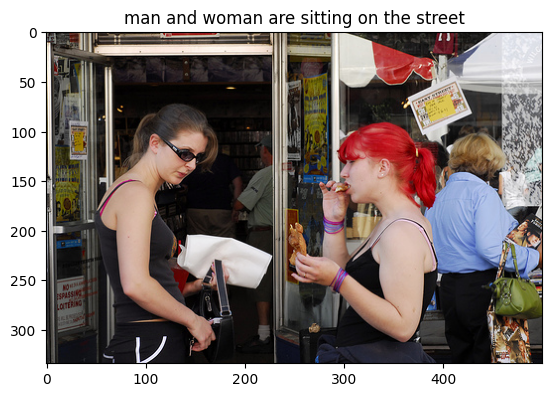

  3%|▎         | 1/30 [05:13<2:31:45, 314.00s/it]

Epoch ->  1  Training Loss ->  3.5956225395202637 Eval Loss ->  3.4726650714874268
Writing Model at epoch  1
544301311_5e7d69a517.jpg
Actual Captions : 
['The women sit outside on the steps reading and drinking .', 'Two girls sit by a doorway on the steps .', 'Two women in period dress sitting in a doorway .', 'Two women in traditional European dress sit on a stoop , one drinking , the other reading .', 'Two women with white head garb and long dresses sitting in front of a door on steps reading and drinking a beverage .']
Predicted Caption: man in white shirt and woman sitting on bench


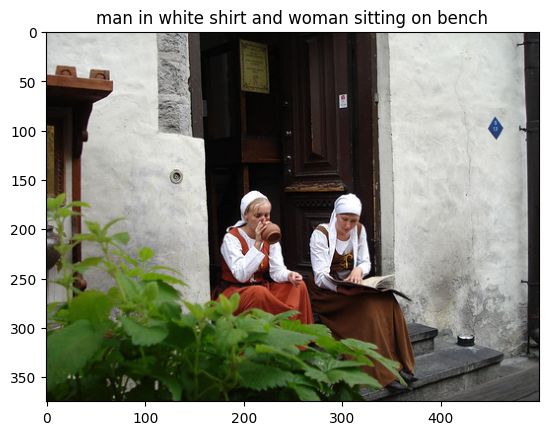

  7%|▋         | 2/30 [10:31<2:27:24, 315.86s/it]

Epoch ->  2  Training Loss ->  3.2378311157226562 Eval Loss ->  3.341691017150879
Writing Model at epoch  2
464251704_b0f0c4c87a.jpg
Actual Captions : 
['a girl in a pink top is swinging with her hair flying everywhere .', 'A girl is swinging .', 'A girl is swinging and looking down with her hair flying .', "A girl 's hair streams behind her as she swings", 'A girl with long hair flying in the breeze while she swings .']
Predicted Caption: girl in red shirt is jumping over log


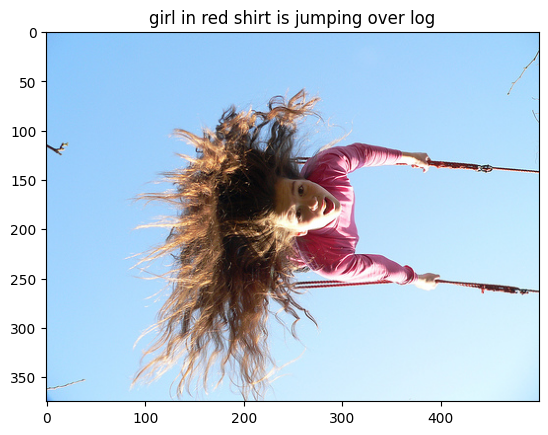

 10%|█         | 3/30 [15:48<2:22:25, 316.49s/it]

Epoch ->  3  Training Loss ->  2.9770894050598145 Eval Loss ->  3.2763924598693848
Writing Model at epoch  3
823675317_b5fbdb17b3.jpg
Actual Captions : 
['Young boy in blue shorts at the beach .', 'The boy in the blue shorts is carrying a bucket on the beach .', 'A child walks on the beach with a bucket .', 'a boy in blue carries a bucket .', 'A boy in blue swim trunks carries a blue bucket down a crowded beach .']
Predicted Caption: young boy in blue shorts and blue shorts is standing on the beach


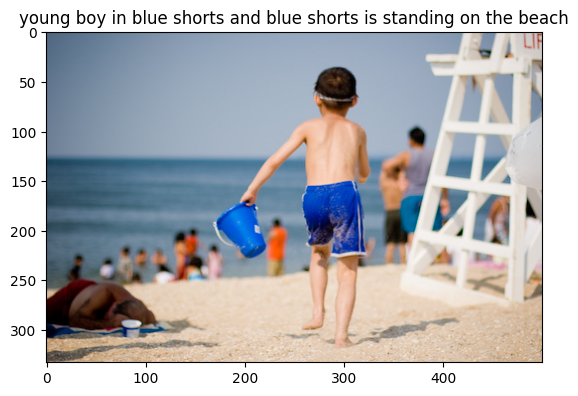

 13%|█▎        | 4/30 [21:05<2:17:16, 316.78s/it]

Epoch ->  4  Training Loss ->  2.750324010848999 Eval Loss ->  3.2665839195251465
Writing Model at epoch  4
519059913_4906fe4050.jpg
Actual Captions : 
['A young boy jumping upside-down into a pool .', 'A brown-haired boy in swim trunks is flipped backwards over a swimming pool .', 'A boy falling headfirst into a pool', 'A boy doing a back flip into a swimming pool .', 'A boy wearing red and blue swim trunks jumping headfirst into a swimming pool .']
Predicted Caption: man in blue shirt is jumping into swimming pool


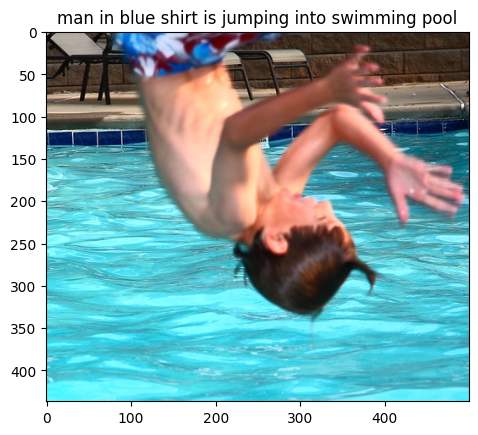

 17%|█▋        | 5/30 [26:22<2:11:57, 316.69s/it]

Epoch ->  5  Training Loss ->  2.5440449714660645 Eval Loss ->  3.2788045406341553
537390477_7dd3407f96.jpg
Actual Captions : 
['Two dog wrestling .', 'Two dogs wrestling in front of a fireplace', 'The black dog and brown dog are wrestling in front of the fireplace .', 'A black and a brown dog are fighting .', 'The black dog and the brown dog appear to be wrestling .']
Predicted Caption: dog is laying down on its back on the grass


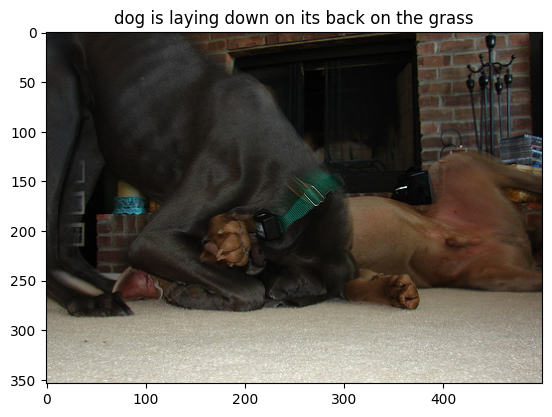

 20%|██        | 6/30 [31:35<2:06:09, 315.39s/it]

Epoch ->  6  Training Loss ->  2.353034019470215 Eval Loss ->  3.296971082687378
836768303_d748df5546.jpg
Actual Captions : 
['A small blonde boy and another small child are inside a cushion doghouse with a brown dog .', 'Two children and a brown dog in a brown tube .', 'Two children and a dog are in a bedroll .', 'Two children in an enclosed dog bed with the dog .', 'Two youn boys lay in a dog house with their dog .']
Predicted Caption: brown dog is carrying stick in its mouth


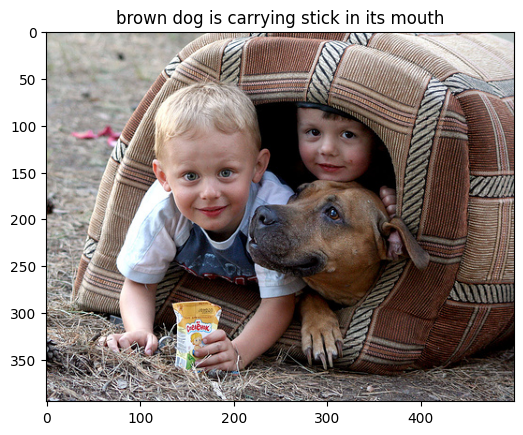

 23%|██▎       | 7/30 [36:47<2:00:35, 314.57s/it]

Epoch ->  7  Training Loss ->  2.1765127182006836 Eval Loss ->  3.323805809020996
447733067_09cfac3286.jpg
Actual Captions : 
['The woman in the purple bikini and pink top is wearing a safety helmet .', 'Girl in bikini bottoms , boots and a helmet walking away at a street fair .', 'A girl in a skimpy bikini outfit walks and carries a helmet .', 'A scantily clad girl , in a helmet , walks away from the camera , down a busy sidewalk .', 'A woman wearing a helmet , tall boots , and short shorts walks down the street .']
Predicted Caption: group of people walking down the street with one person in the background


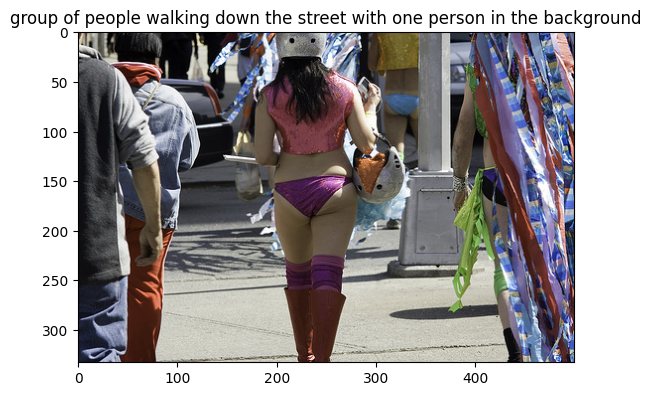

 27%|██▋       | 8/30 [42:00<1:55:09, 314.07s/it]

Epoch ->  8  Training Loss ->  1.9849250316619873 Eval Loss ->  3.350368022918701
528498076_43f0ef36b5.jpg
Actual Captions : 
['Child in white jumping on bed', 'A toddler in a white sports shorts set jumping on a bed', 'A little boy wearing white jumps on the bed .', 'A boy jumps on a bed .', 'A kid is jumping on a structure covered with soft material .']
Predicted Caption: little girl and little girl are standing on the bed


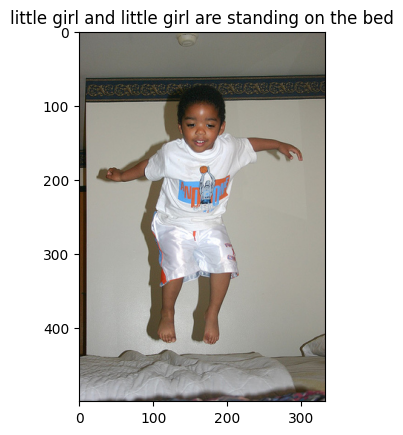

 30%|███       | 9/30 [47:13<1:49:47, 313.71s/it]

Epoch ->  9  Training Loss ->  1.8538473844528198 Eval Loss ->  3.3845362663269043
554526471_a31f8b74ef.jpg
Actual Captions : 
['A group exercise session at the beach .', 'A group of people are doing aerobics in the ocean .', 'A woman is leading an exercise group on the seashore .', 'many people exercising in the ocean', 'The ladies do water aerobics on the beach .']
Predicted Caption: group of people are rowing boat on the beach


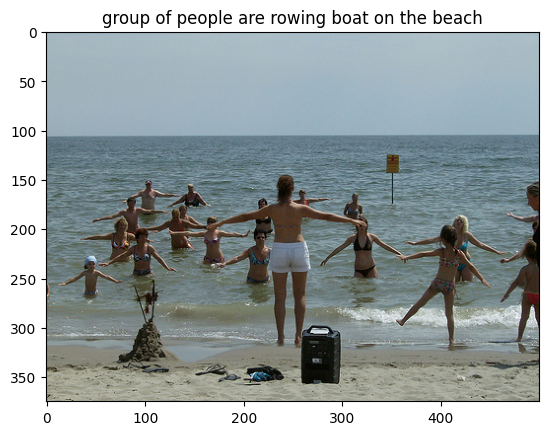

 33%|███▎      | 10/30 [52:26<1:44:30, 313.53s/it]

Epoch ->  10  Training Loss ->  1.7351409196853638 Eval Loss ->  3.420102119445801
632608471_a70461f123.jpg
Actual Captions : 
['A group of little girls perform a recital onstage dressed in all white .', 'Eleven girls in white tutus stand and pose onstage .', 'Group of ballerinas in white tutus get ready to dance', 'The little ballerinas are all wearing white bows , dresses and leggings .', 'Young girl ballerinas in white tutus on a stage .']
Predicted Caption: team of dogs are playing with their hands in the air


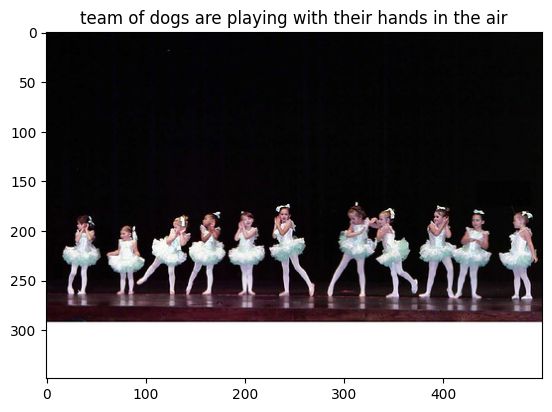

 37%|███▋      | 11/30 [57:40<1:39:14, 313.39s/it]

Epoch ->  11  Training Loss ->  1.5990564823150635 Eval Loss ->  3.4491734504699707
843616798_5ab0ecb525.jpg
Actual Captions : 
['A black and white dog is herding a group of sheep on a dusty road .', 'A black and white dog is watching over a flock of white sheep .', 'A dog in near a herd of sheep .', 'A sheepdog is rounding up a herd of sheep .', 'A wolf-like dog herds a pack of white sheep on a dusty farm .']
Predicted Caption: two dogs are standing near sheep and one is being pulled by another


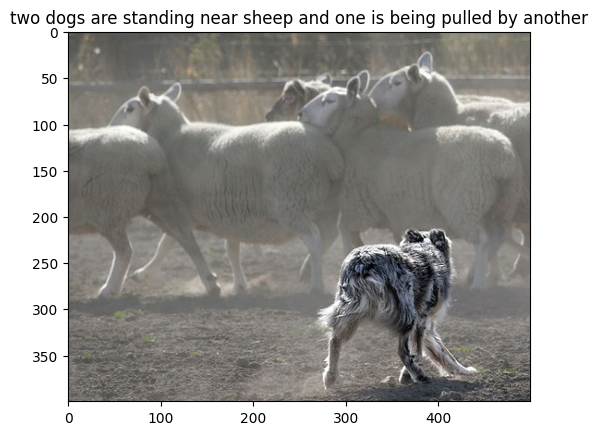

 40%|████      | 12/30 [1:02:53<1:34:02, 313.45s/it]

Epoch ->  12  Training Loss ->  1.5084882974624634 Eval Loss ->  3.479296922683716
584484388_0eeb36d03d.jpg
Actual Captions : 
['Two daschunds play with a red ball', 'Two brown dogs run over the grass carrying a red toy .', 'Two little wiener dogs are running on the grass carrying a red ball between them .', 'Two brown dogs are playing with a red ball .', 'Two brown dogs fight over a red ball while playing in the grass .']
Predicted Caption: two dogs fight over stick


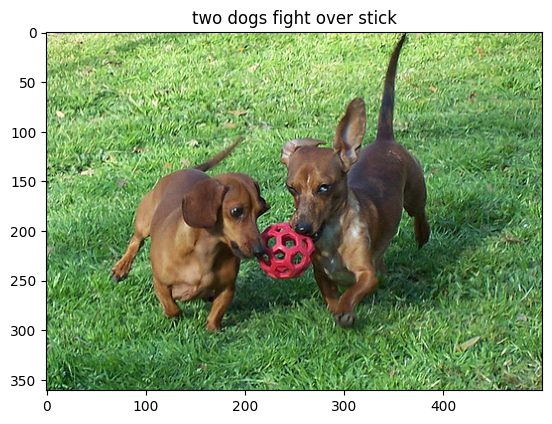

 43%|████▎     | 13/30 [1:08:06<1:28:48, 313.42s/it]

Epoch ->  13  Training Loss ->  1.4232200384140015 Eval Loss ->  3.5037732124328613
478208896_90e7187b64.jpg
Actual Captions : 
['A girl climbs a huge rock .', 'A lady in black pants and her shadow , climb large rocks .', 'A rock climber taking a large step up the side of a rock face .', 'Girl in black pants climbing smooth rock .', 'Young woman wearing striped shirt rock climbing .']
Predicted Caption: man climbs on big rock


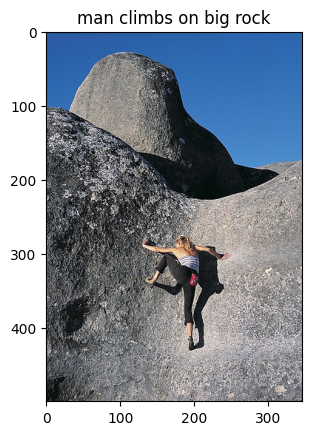

 47%|████▋     | 14/30 [1:13:19<1:23:32, 313.27s/it]

Epoch ->  14  Training Loss ->  1.3249658346176147 Eval Loss ->  3.531942367553711
795081510_53fd17d101.jpg
Actual Captions : 
['A couple hold each other , standing on a ferry , looking out at a ferry .', 'A couple standing on the deck of a boat watching the water .', 'A man embraces a woman as they look over the railing out over the water at a ship .', 'Couple overlooking a metal rail with water and a boat int he background .', 'The couple is together looking at the large ship in the ocean .']
Predicted Caption: man and woman are walking along an ocean setting up the ocean


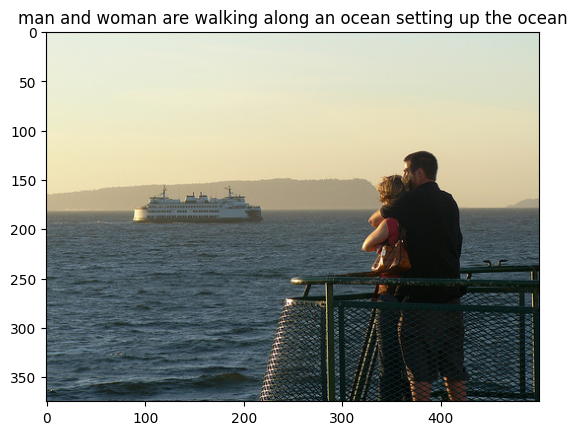

 50%|█████     | 15/30 [1:18:32<1:18:17, 313.18s/it]

Epoch ->  15  Training Loss ->  1.2632458209991455 Eval Loss ->  3.5632545948028564
522700240_d9af45e60d.jpg
Actual Captions : 
['A dog is covered from nose to knees in a blue sheet .', 'A dog laying with a blue blanket over his eyes .', 'A dog lays on a bed with a blue sheet while also partially covered with a blue sheet .', 'A dog under a sheet .', 'The dog is sleeping on top of the bed covered by the blue sheet .']
Predicted Caption: dog is laying on his head on the ground


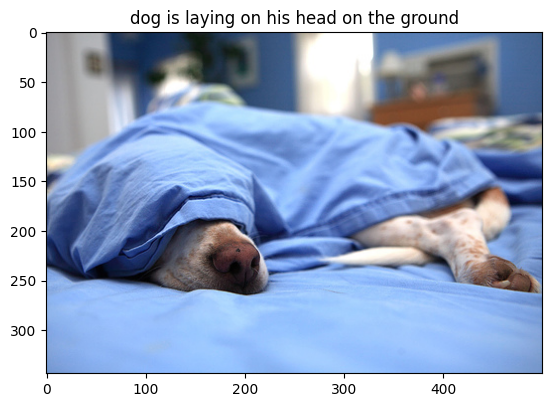

 53%|█████▎    | 16/30 [1:23:45<1:13:02, 313.06s/it]

Epoch ->  16  Training Loss ->  1.2025102376937866 Eval Loss ->  3.5888149738311768
96399948_b86c61bfe6.jpg
Actual Captions : 
['A giant inflatable ball , taller than a man , is chased by two men in orange shirts .', 'The men are on a hill with a giant white ball .', 'Two men are trying to push this very large inflatable golf ball', 'two men roll a huge ball .', 'Two workers in orange and black set up bubble']
Predicted Caption: young boy running through the grass


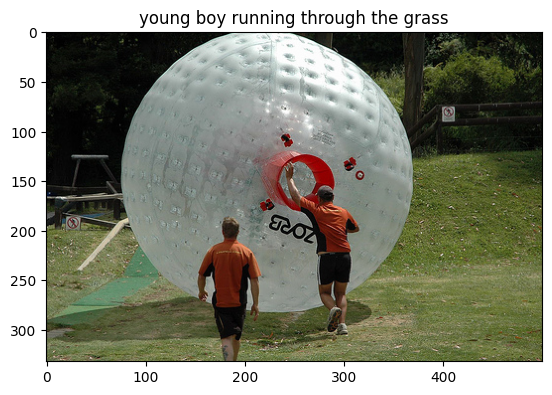

 57%|█████▋    | 17/30 [1:28:58<1:07:49, 313.07s/it]

Epoch ->  17  Training Loss ->  1.1304826736450195 Eval Loss ->  3.6129705905914307
957682378_46c3b07bcd.jpg
Actual Captions : 
['A brown dog and a black dog run into each other in the grass .', 'A brown dog is grabbing the collar of a black dog .', 'A dark black dog is playing with a light brown dog in a backyard .', 'Two dogs are wrestling in a field .', 'Two dogs are wrestling in the park .']
Predicted Caption: dog runs in the grass


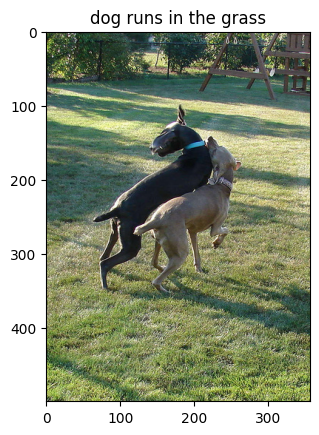

 60%|██████    | 18/30 [1:34:11<1:02:36, 313.07s/it]

Epoch ->  18  Training Loss ->  1.0880128145217896 Eval Loss ->  3.6387100219726562
911795495_342bb15b97.jpg
Actual Captions : 
['The girl in the red shirt smiles on the swing .', 'a young girl with long brown hair holding a black and red striped stick .', 'A girl wearing an orange shirt holds onto poles and looks down .', 'A girl sits on a swing .', 'A soft focus picture of a little girl wearing an orange sweater .']
Predicted Caption: girl in red shirt and black swimsuit swinging on swing


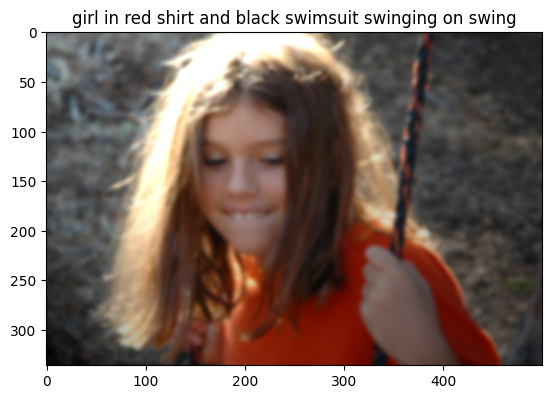

 63%|██████▎   | 19/30 [1:39:25<57:24, 313.14s/it]  

Epoch ->  19  Training Loss ->  1.0443881750106812 Eval Loss ->  3.6586620807647705
802594049_289e3c8420.jpg
Actual Captions : 
['A black man with facial hair wears a navy hat and blue jacket in front of a white background .', 'A man in blue cap and jacket looks frustrated .', 'A man wearing a backwards baseball cap .', 'A man wearing a blue baseball cap is gazing into the distance .', 'A man with a beard and a navy blue backwards baseball cap stares intently at something in the distance .']
Predicted Caption: man in blue shirt and sunglasses smiles


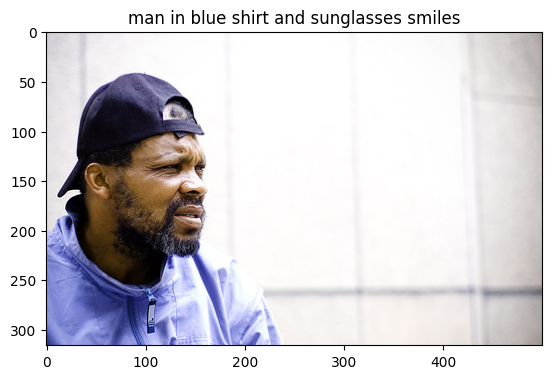

 67%|██████▋   | 20/30 [1:44:38<52:11, 313.19s/it]

Epoch ->  20  Training Loss ->  0.9897596836090088 Eval Loss ->  3.678661346435547
460935487_75b2da7854.jpg
Actual Captions : 
['A white and black dog in a hallway filled with potted plants .', 'A dog is turns back toward the camera near some potted plants .', 'A dog turning to look at the camera .', 'A black and white dog is running up a path towards some potted plants .', 'A dog follows another dog around the corner but looks back .']
Predicted Caption: two dogs are playing together in front of white and red brick building


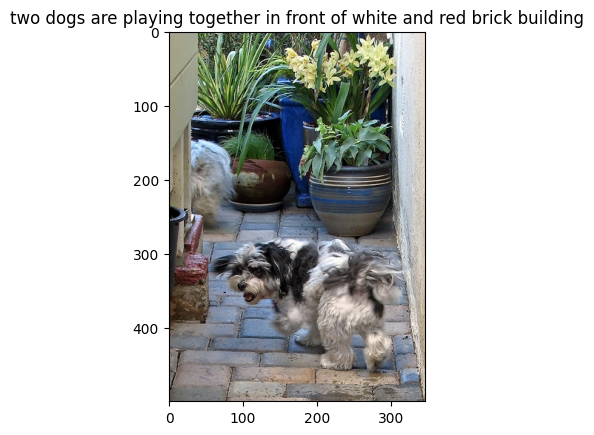

 70%|███████   | 21/30 [1:49:51<46:59, 313.24s/it]

Epoch ->  21  Training Loss ->  0.9593636393547058 Eval Loss ->  3.6959972381591797
476740978_45b65ebe0c.jpg
Actual Captions : 
['A group of people are holding up signs .', 'A group of people carry pink letters that spell " impeach " .', 'many woman hold up a sign reading " impeach " .', 'People holding pink signs that spell out , " Impeach " .', 'War protesters on curb , with pink umbrellas spelling out IMPEACH .']
Predicted Caption: girl in pink shirt and pink hat walks down the street


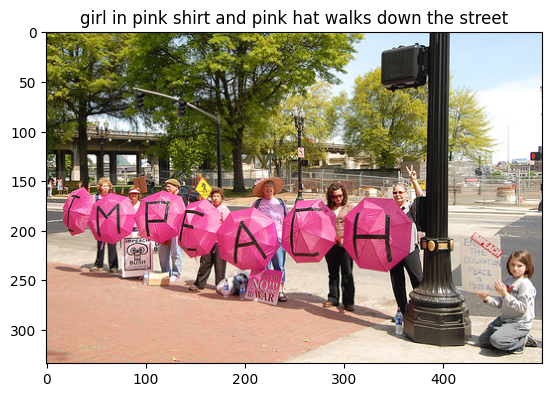

 73%|███████▎  | 22/30 [1:55:05<41:46, 313.35s/it]

Epoch ->  22  Training Loss ->  0.9298049807548523 Eval Loss ->  3.7114477157592773
562588230_edb2c071c8.jpg
Actual Captions : 
['A small girl in a bathing suit jumps above a kiddie pool .', 'A child is jumping into an inflatable swimming pool .', 'A girl plays in an inflatable pool .', 'A girl plays in a small pool .', 'A little girl plays in a blow up pool .']
Predicted Caption: little girl is sitting on the sidewalk in an outdoor setting


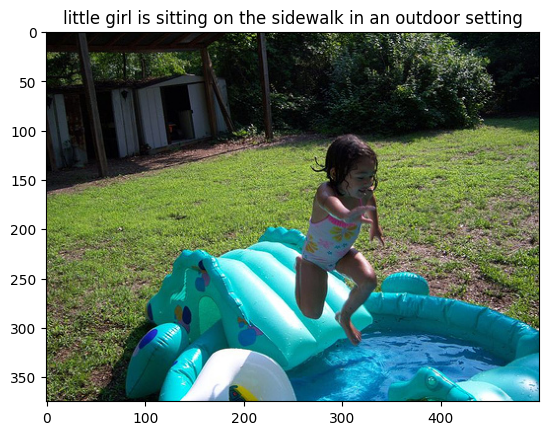

 77%|███████▋  | 23/30 [2:00:19<36:34, 313.46s/it]

Epoch ->  23  Training Loss ->  0.8896714448928833 Eval Loss ->  3.7277326583862305
504904434_889f426c6e.jpg
Actual Captions : 
['A person runs with a small football .', 'a young boy running on a sidewalk holding a small football .', 'A boy runs with a very small football down a paved walkway .', 'A boy runs past a house carrying a very small plastic foam football .', 'A boy holding a toy football , runs along a paved path .']
Predicted Caption: young boy wearing white shirt with his arms spread


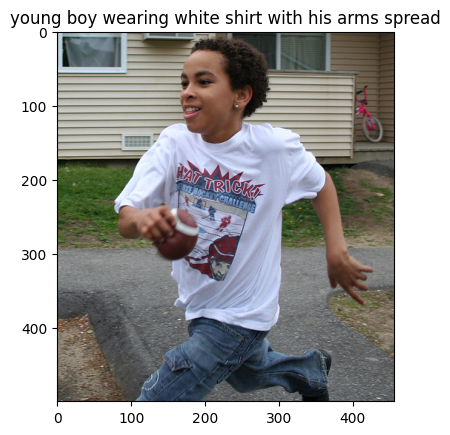

 80%|████████  | 24/30 [2:05:32<31:21, 313.55s/it]

Epoch ->  24  Training Loss ->  0.8646857142448425 Eval Loss ->  3.751662492752075
911795495_342bb15b97.jpg
Actual Captions : 
['The girl in the red shirt smiles on the swing .', 'a young girl with long brown hair holding a black and red striped stick .', 'A girl wearing an orange shirt holds onto poles and looks down .', 'A girl sits on a swing .', 'A soft focus picture of a little girl wearing an orange sweater .']
Predicted Caption: girl with red hair and black shirt is swinging on blue swing


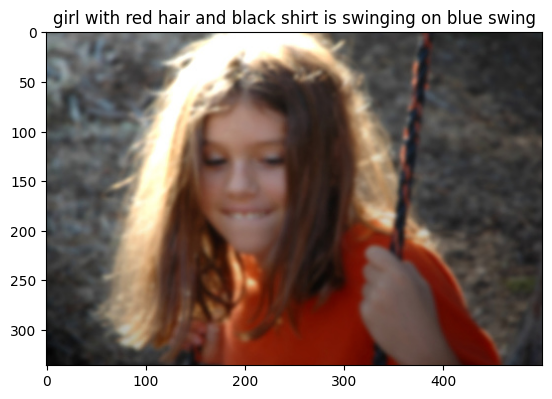

 83%|████████▎ | 25/30 [2:10:46<26:08, 313.66s/it]

Epoch ->  25  Training Loss ->  0.8424975872039795 Eval Loss ->  3.765637159347534
519754987_51861fea85.jpg
Actual Captions : 
['People of all ilks on a busy street .', 'A young woman riding a bike down a street past a crowd of people .', 'A skinny girl rides by on a bike with a lot of people in the background .', 'A thin young woman in a green t-shirt cycles by a grey car .', 'A woman riding a bicycle past a car and a group of people on a sidewalk .']
Predicted Caption: girl in blue shirt and pink pants is looking at the camera


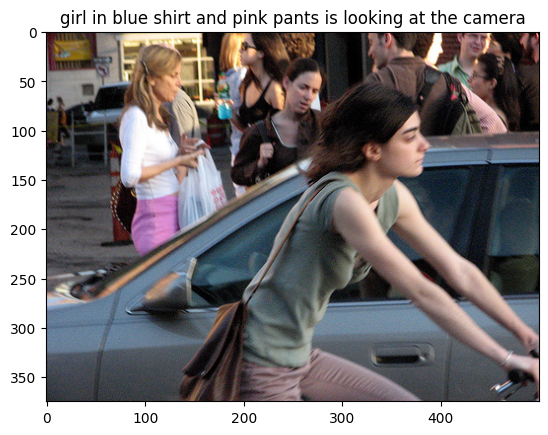

 87%|████████▋ | 26/30 [2:16:00<20:55, 313.79s/it]

Epoch ->  26  Training Loss ->  0.8153648972511292 Eval Loss ->  3.775697946548462
523692399_d2e261a302.jpg
Actual Captions : 
['A view from the top of a skateboarder at the top of a ramp .', 'A skateboarder wearing a grey helmet is riding his board along a concrete curve .', 'A shirtless skateboarder .', 'A man wears a black helmet and is on a black skateboard .', 'A girl performs skateboarding tricks in an arena for skateboarders , while wearing a helmet .']
Predicted Caption: man in black wetsuit is dropping from the rock wall


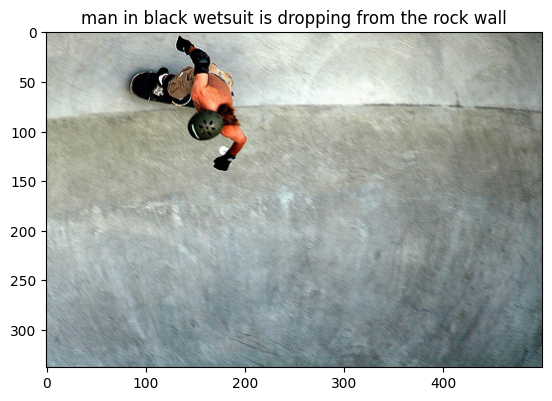

 90%|█████████ | 27/30 [2:21:14<15:41, 313.87s/it]

Epoch ->  27  Training Loss ->  0.7977712750434875 Eval Loss ->  3.7977054119110107
946051430_8db7e4ce09.jpg
Actual Captions : 
['The five girls wearing swimsuits jump into the water .', 'Girls in swimsuits , holding hands and leaping into water .', 'Five girls in swimsuits , are seen from the back , jumping into the water .', 'A group of five women and girls in bathing suits jumps into the water with their backs to the camera .', 'girls in swimsuits jumping into water from behind']
Predicted Caption: two women in bathing suits are hugging each other in the water


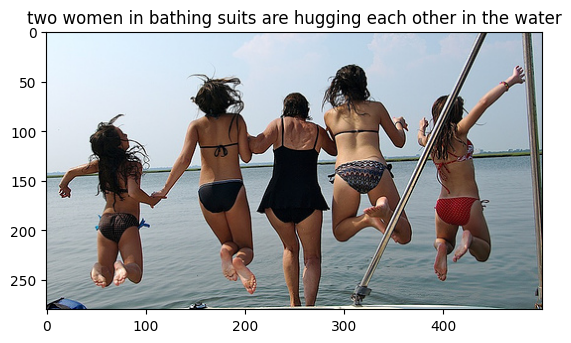

 93%|█████████▎| 28/30 [2:26:30<10:28, 314.28s/it]

Epoch ->  28  Training Loss ->  0.780562698841095 Eval Loss ->  3.810062885284424
751074141_feafc7b16c.jpg
Actual Captions : 
['A boy being pulled on a shovel .', 'A happy child play in the scoop of a shovel by a chair in a grassy backyard .', 'A little boy in red flowered shorts is sitting on a shovel .', 'A little boy smiling and riding in a shovel .', 'Small boy in red shorts with blue flowers sitting on shovel in the grass near a tan chair .']
Predicted Caption: young boy with red shirt is playing outside


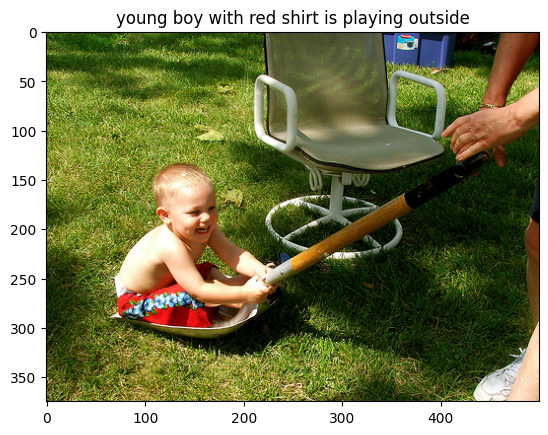

 97%|█████████▋| 29/30 [2:31:45<05:14, 314.70s/it]

Epoch ->  29  Training Loss ->  0.7589820623397827 Eval Loss ->  3.8118410110473633
526661994_21838fc72c.jpg
Actual Captions : 
['A dog is running away in the grass', 'A dog running on grass .', 'A dog running through the grass .', 'a dog runs across the grass .', 'A dog runs through the grass .']
Predicted Caption: black and brown dog jumping in the air while walking on grassy surface


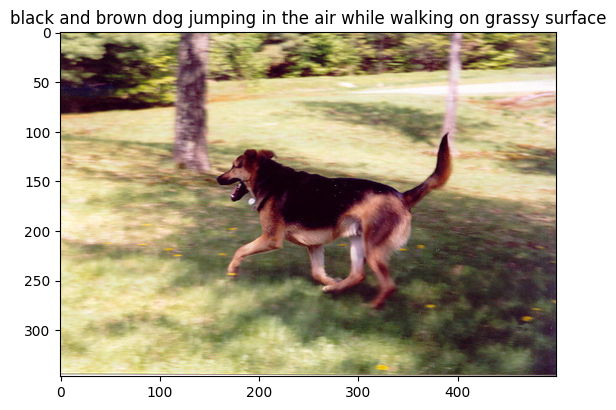

100%|██████████| 30/30 [2:37:01<00:00, 314.05s/it]


In [32]:
for epoch in tqdm(range(EPOCHS)):
    total_epoch_train_loss = 0
    total_epoch_valid_loss = 0
    total_train_words = 0
    total_valid_words = 0
    model.train()

    for caption_seq, target_seq, image_embed in train_dataloader_resnet:
        image_embed = image_embed.squeeze(1).to(device)
        caption_seq = caption_seq.to(device)
        target_seq = target_seq.to(device)

        output, padding_mask = model.forward(image_embed, caption_seq)
        output = output.permute(1, 2, 0)

        loss = criterion(output,target_seq)
        optimizer.zero_grad()

        loss_masked = torch.mul(loss, padding_mask)

        final_batch_loss = torch.sum(loss_masked)/torch.sum(padding_mask)

        final_batch_loss.backward()
        optimizer.step()
        total_epoch_train_loss += torch.sum(loss_masked).detach().item()
        total_train_words += torch.sum(padding_mask)


    total_epoch_train_loss = total_epoch_train_loss/total_train_words


    model.eval()
    with torch.no_grad():
        for caption_seq, target_seq, image_embed in valid_dataloader_resnet:

            image_embed = image_embed.squeeze(1).to(device)
            caption_seq = caption_seq.to(device)
            target_seq = target_seq.to(device)

            output, padding_mask = model.forward(image_embed, caption_seq)
            output = output.permute(1, 2, 0)

            loss = criterion(output,target_seq)

            loss_masked = torch.mul(loss, padding_mask)

            total_epoch_valid_loss += torch.sum(loss_masked).detach().item()
            total_valid_words += torch.sum(padding_mask)

    total_epoch_valid_loss = total_epoch_valid_loss/total_valid_words

    print("Epoch -> ", epoch," Training Loss -> ", total_epoch_train_loss.item(), "Eval Loss -> ", total_epoch_valid_loss.item() )

    if min_val_loss > total_epoch_valid_loss:
        print("Writing Model at epoch ", epoch)
        torch.save(model, './BestModel')
        min_val_loss = total_epoch_valid_loss

    random_img = random.randint(0, len(unq_valid_imgs) - 1)
    image_name = unq_valid_imgs.iloc[random_img]['image']
    predicted_caption = generate_caps(image_name)
    scheduler.step(total_epoch_valid_loss.item())


641893280_36fd6e886a.jpg
641893280_36fd6e886a.jpg
Actual Captions : 
['a brown dog and a white dog are running across a stony hillock .', 'Two brown and white dogs , one a boxer and the other a terrier , play on a rock covered hill with a blue sky and powdery clouds in the background .', 'Two brown and white dogs run on rocks , sky in background .', 'Two dogs are running along a rocky hill .', 'Two dogs run next to each other across rough terrain .']
Predicted Caption: two dogs are playing with each other in the snow


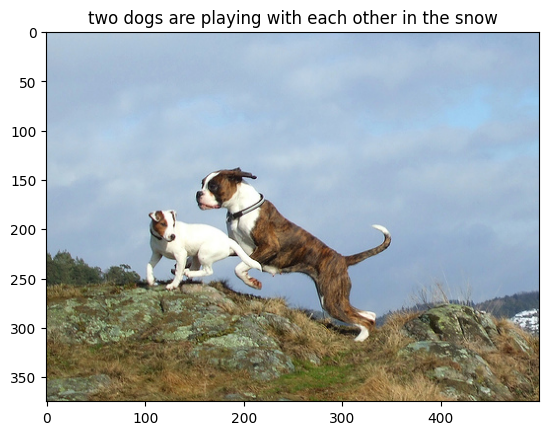

['two', 'dogs', 'are', 'playing', 'with', 'each', 'other', 'in', 'the', 'snow']

In [33]:
random_img = random.randint(0, len(unq_valid_imgs) - 1)
image_name = unq_valid_imgs.iloc[random_img]['image']
print(image_name)
generate_caps(image_name)